# XAI and DataDrift 02

- 연구노트, 데이터 드리프트, JPark
- 2025-07-10
- with Gemini 2.5 Flash
- 데이터 드리프트 대응 코드를 MNIST 숫자 인식 데이터셋 기반으로 수정하고, 모듈화하여 데이터가 달라져도 재사용 가능하도록 구현

## 예제

-----

이 코드는 다음과 같은 모듈식 구성 요소를 포함합니다:

1.  **`DataLoader` 클래스:** MNIST 데이터를 로드하고 전처리합니다. (실제 프로젝트에서는 외부 데이터셋 로더로 대체 가능)
2.  **`ModelTrainer` 클래스:** PyTorch 모델을 정의하고 학습합니다.
3.  **`DriftDetector` 클래스:** 데이터 드리프트를 감지하고 보고합니다.
4.  **`XAIAnalyzer` 클래스:** SHAP 및 LIME을 사용하여 드리프트 원인을 분석합니다.
5.  **`DriftResolver` 클래스:** 드리프트 감지 및 XAI 분석 결과를 바탕으로 재학습 방향성 및 모델 아키텍처 조정을 제안합니다.

-----

## MNIST 기반 데이터 드리프트 대응 코드 (모듈화)

먼저, 필요한 라이브러리를 설치합니다.

```bash
pip install torch torchvision scikit-learn shap lime matplotlib seaborn pandas numpy
```

### 1\. 모듈 코드 (`drift_detection_module.py` 파일)

아래 코드를 `drift_detection_module.py` 파일로 저장하세요.

```python
# drift_detection_module.py
```

-----

### 2\. 메인 실행 코드 (`main.py` 또는 Jupyter Notebook 셀)

아래 코드를 Jupyter Notebook에서 실행하거나, `main.py` 파일로 저장한 후 실행합니다.

```python
# main.py 또는 Jupyter Notebook 셀
```

-----

### 코드 설명 및 재사용성

#### 모듈화된 구성 요소의 역할:

  * **`MNISTDataLoader` (데이터 로딩):**

      * **재사용성:** 이 클래스만 변경하면 다른 이미지 데이터셋(CIFAR-10, Fashion MNIST 등)이나 심지어 테이블 형식 데이터셋(특성 평탄화 로직 변경 필요)도 쉽게 로드할 수 있습니다. `transform` 부분을 해당 데이터셋에 맞게 조정하고, `flatten_images` 메서드 또한 데이터 형태에 맞게 수정합니다.
      * **드리프트 시뮬레이션:** `get_new_data_loader`에서 `drift_type`을 변경하여 다양한 드리프트 시나리오를 테스트할 수 있습니다. 실제 배포 환경에서는 이 부분이 실제 프로덕션 데이터 로딩 로직으로 대체됩니다.

  * **`SimpleCNN` 및 `ModelTrainer` (모델 및 학습):**

      * **재사용성:** `SimpleCNN` 클래스만 다른 PyTorch 모델 아키텍처(예: ResNet, Transformer)로 교체하면 됩니다. `ModelTrainer`는 어떤 PyTorch `nn.Module`도 학습하고 평가할 수 있도록 범용적으로 설계되었습니다. `get_model_and_predict_proba`는 XAI 라이브러리(SHAP, LIME)가 요구하는 `predict_proba` 형식의 래퍼 함수를 제공합니다.
      * **PyTorch 모델의 SHAP/LIME:** 이미지 데이터를 Flatten하여 1D 벡터로 만든 후 `KernelExplainer`를 사용합니다. **주의:** 이미지 데이터의 경우 `KernelExplainer`는 픽셀 수가 많으면 계산이 매우 느려질 수 있습니다. 실제 딥러닝 모델에는 SHAP의 `DeepExplainer`(`shap.DeepExplainer(model, X_background)`)나 `GradientExplainer`가 더 적합하며 빠릅니다. `DeepExplainer`를 사용하려면 `predict_proba_fn` 대신 모델과 입력 텐서를 직접 처리하도록 `XAIAnalyzer` 내부 로직을 수정해야 합니다.

  * **`DriftDetector` (드리프트 감지):**

      * **재사용성:** 데이터의 특성 수와 관계없이 KS 검정을 수행하여 특성 드리프트를 감지합니다. 또한 모델 성능 저하를 통한 드리프트 감지 로직도 포함합니다. `drift_threshold_p_value`와 `performance_drop_threshold`를 조정하여 감지 민감도를 조절할 수 있습니다.
      * **확장성:** 통계적 검정 외에도 ATE, MMD 등 다른 드리프트 감지 기법을 추가할 수 있습니다.

  * **`XAIAnalyzer` (XAI 분석):**

      * **재사용성:** `predict_proba_fn` 인터페이스를 통해 어떤 모델이든 SHAP과 LIME 분석을 수행할 수 있습니다. `feature_names`만 제대로 전달되면 다양한 특성 공간에 대한 분석이 가능합니다.
      * **성능 고려:** MNIST와 같은 고차원 데이터셋의 경우, SHAP(`KernelExplainer`) 및 LIME 계산 시간이 매우 오래 걸릴 수 있으므로, 코드에 `num_samples_to_explain`과 같이 **설명할 샘플 수를 제한**하는 옵션을 추가했습니다. 실제 환경에서는 더 효율적인 샘플링 전략이나 차원 축소 기법을 적용하는 것이 좋습니다.
      * **SHAP KernelExplainer의 특성:** `KernelExplainer`의 `shap_values`는 `(num_samples, num_features, num_classes)` 형태이므로, 평균 절대 SHAP 값을 계산할 때 `axis=(0, 2)`를 사용하여 샘플과 클래스 차원을 함께 평균냅니다. `summary_plot` 시각화 시에는 특정 클래스에 대한 `shap_values`를 선택해야 합니다.

  * **`DriftResolver` (드리프트 해결 제안):**

      * **재사용성:** 드리프트 감지 및 XAI 분석 결과를 추상적으로 받아서 재학습 및 모델 조정 방향성을 제시합니다. 특정 데이터셋이나 모델에 종속되지 않고 일반적인 가이드라인을 제공합니다.
      * **구체화:** 실제 프로젝트에서는 이 클래스의 제안이 특정 팀의 워크플로우나 자원에 맞춰 더 구체적인 액션 아이템으로 변환될 수 있습니다.

-----

이 모듈화된 접근 방식은 데이터 과학 프로젝트에서 드리프트 감지 및 대응 시스템을 구축할 때 유연성과 재사용성을 크게 높여줄 것입니다.

/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/torchvision/io/image.py:14: UserWarning: Failed to load image Python extension: 'dlopen(/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/torchvision/image.so, 0x0006): Library not loaded: @rpath/libjpeg.9.dylib
  Referenced from: <367D4265-B20F-34BD-94EB-4F3EE47C385B> /opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/torchvision/image.so
  Reason: tried: '/opt/homebrew/opt/openssl@3/lib/libjpeg.9.dylib' (no such file), '/libjpeg.9.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/torchvision/../../../libjpeg.9.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/site-packages/torchvision/../../../libjpeg.9.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/lib/python3.12/lib-dynload/../../libjpeg.9.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/bin/../lib/libjpeg.9.dylib' (no such file)'If you do

--- 1. 데이터 로드 및 모델 학습 ---
모델 학습 시작 (Epochs: 1)...
Train Epoch: 1 [0/48000 (0%)]	Loss: 2.297281
Train Epoch: 1 [6400/48000 (13%)]	Loss: 0.342144
Train Epoch: 1 [12800/48000 (27%)]	Loss: 0.224665
Train Epoch: 1 [19200/48000 (40%)]	Loss: 0.238823
Train Epoch: 1 [25600/48000 (53%)]	Loss: 0.094880
Train Epoch: 1 [32000/48000 (67%)]	Loss: 0.316420
Train Epoch: 1 [38400/48000 (80%)]	Loss: 0.184591
Train Epoch: 1 [44800/48000 (93%)]	Loss: 0.057240
모델 학습 완료.
INFO: 'feature' 드리프트 주입 - 이미지 밝기 및 노이즈 변경

Initial Test set: Average loss: 0.0001, Accuracy: 11779/12000 (98%)


--- 2. 데이터 드리프트 감지 ---

각 특성의 분포 변화 (Kolmogorov-Smirnov Test):
  특성 'pixel_261': KS 통계량=0.0437, p-value=0.0028 -> 드리프트 의심!
  특성 'pixel_262': KS 통계량=0.0389, p-value=0.0108 -> 드리프트 의심!
  특성 'pixel_269': KS 통계량=0.0337, p-value=0.0401 -> 드리프트 의심!
  특성 'pixel_288': KS 통계량=0.0352, p-value=0.0281 -> 드리프트 의심!
  특성 'pixel_289': KS 통계량=0.0460, p-value=0.0014 -> 드리프트 의심!
  특성 'pixel_290': KS 통계량=0.0381, p-value=0.0135 -> 드리프트 의심!
  특성 'pixe

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]


초기 데이터 특성 중요도 (SHAP 평균 절대값 - Top 10):
pixel_542    0.001727
pixel_514    0.001592
pixel_317    0.001522
pixel_515    0.001456
pixel_541    0.001403
pixel_217    0.001334
pixel_543    0.001321
pixel_316    0.001174
pixel_580    0.001136
pixel_299    0.001103
dtype: float64

새로운 데이터 특성 중요도 (SHAP 평균 절대값 - Top 10):
pixel_542    0.001759
pixel_515    0.001604
pixel_543    0.001585
pixel_433    0.001308
pixel_430    0.001216
pixel_345    0.001163
pixel_459    0.001158
pixel_457    0.001147
pixel_318    0.001141
pixel_541    0.001135
dtype: float64

특정 클래스(0)에 대한 SHAP Beeswarm Plot (Top 20 Features):


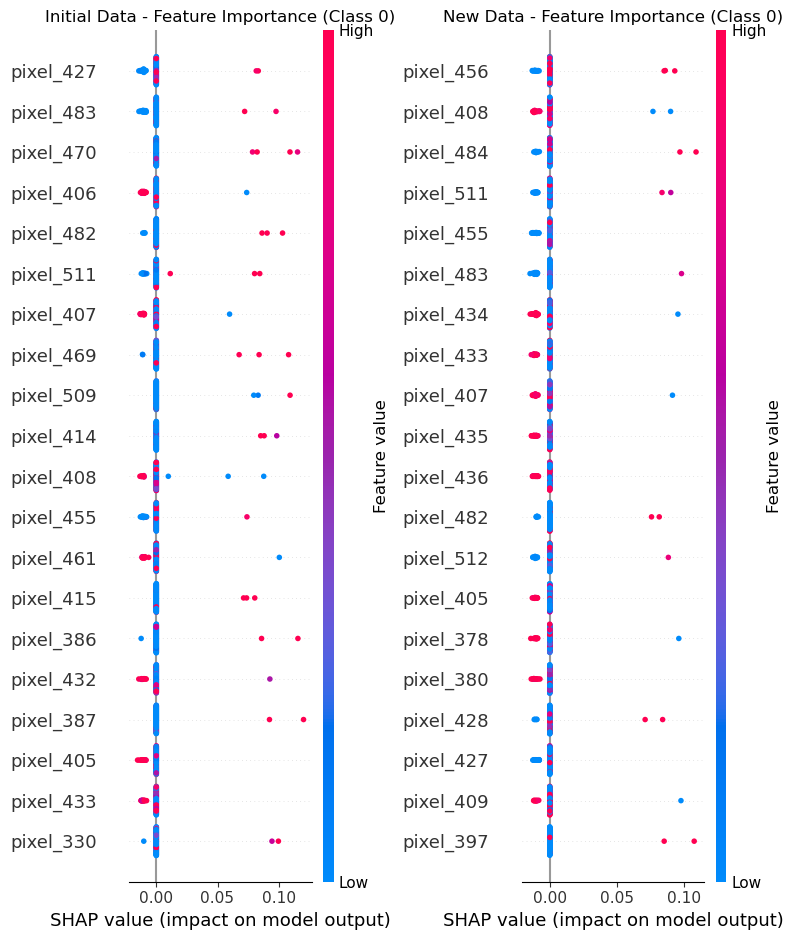


SHAP 값 변화를 통해 드리프트가 모델의 특성 중요도 인식에 영향을 미쳤음을 시사합니다.

3.2. LIME을 이용한 지역적 예측 설명 변화 분석 (샘플 5개):

초기 데이터 샘플 5개에 대한 LIME 설명:

--- Initial Sample 1 (idx: 9002) ---



--- Initial Sample 2 (idx: 9532) ---



--- Initial Sample 3 (idx: 2539) ---



--- Initial Sample 4 (idx: 6077) ---



--- Initial Sample 5 (idx: 4570) ---



새로운 데이터 샘플 5개에 대한 LIME 설명:

--- New Data Sample 1 (idx: 1892) ---



--- New Data Sample 2 (idx: 1961) ---



--- New Data Sample 3 (idx: 38) ---



--- New Data Sample 4 (idx: 131) ---



--- New Data Sample 5 (idx: 702) ---



LIME 설명을 통해 개별 예측에서 중요하게 작용하는 픽셀들이 달라졌음을 확인합니다.

--- 4. 재학습 방향성 제시 및 모델 아키텍처 조정 검토 ---

**재학습 방향성 제시:**
  - 감지된 드리프트 특성: pixel_261, pixel_262, pixel_269, pixel_288, pixel_289 ...
  - 가장 큰 변화를 보이는 특성(픽셀)의 분포를 확인하고, 해당 픽셀 영역의 데이터 품질을 점검합니다.
  - **새로운 데이터를 수집하여 모델을 재학습**하는 것이 시급합니다. 특히 드리프트가 발생한 특성(예: 이미지의 특정 영역, 밝기)의 분포를 반영할 수 있는 데이터를 우선적으로 확보합니다.
  - 가능하다면, 새로운 데이터 분포를 반영할 수 있도록 **데이터 전처리 파이프라인을 업데이트**하는 것을 고려합니다 (예: 새로운 정규화 방식, 노이즈 제거 필터).
  - 데이터 드리프트 모니터링 시스템을 강화하여 드리프트 발생 시 **자동 알림 및 재학습 트리거**를 설정합니다.


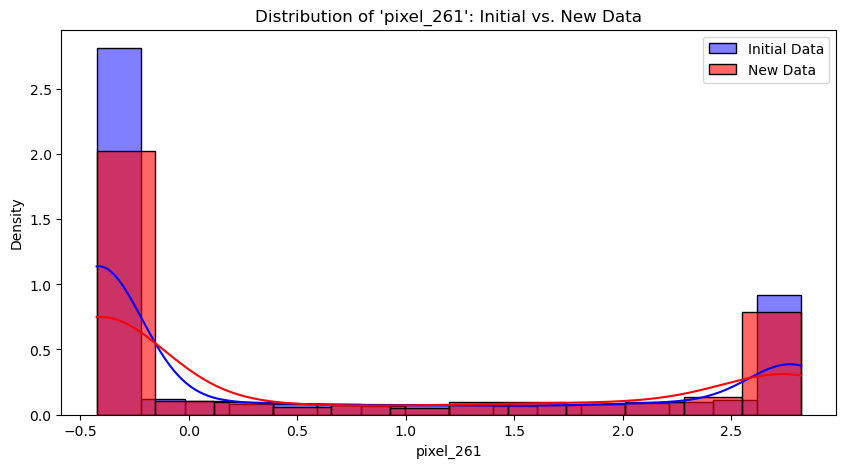


시각화를 통해 가장 드리프트가 큰 'pixel_261' 픽셀의 분포가 초기 데이터와 새로운 데이터에서 크게 달라졌음을 명확히 확인할 수 있습니다.

**모델 아키텍처 조정 검토:**

가장 중요도 변화가 큰 픽셀 (Top 5):
pixel_316    0.000836
pixel_314    0.000793
pixel_497    0.000757
pixel_608    0.000707
pixel_159    0.000683
dtype: float64
  - 특성 중요도의 큰 변화는 감지되지 않았으므로, 모델 아키텍처 조정보다는 데이터 수집/전처리 개선이 우선일 수 있습니다.

--- 데이터 드리프트 대응 프로세스 완료 ---


In [1]:

import torch
from drift_detection_module import MNISTDataLoader, SimpleCNN, ModelTrainer, DriftDetector, XAIAnalyzer, DriftResolver

# --- 설정 ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 64
TEST_BATCH_SIZE = 1000
EPOCHS = 1 # MNIST 학습에 충분한 Epochs

# --- 1. 데이터 로드 및 모델 학습 ---
print("--- 1. 데이터 로드 및 모델 학습 ---")
data_loader = MNISTDataLoader(batch_size=BATCH_SIZE, test_batch_size=TEST_BATCH_SIZE)
train_loader, initial_test_loader = data_loader.get_initial_loaders()

model = SimpleCNN()
model_trainer = ModelTrainer(model, device=DEVICE)
model_trainer.train(train_loader, epochs=EPOCHS)

# XAI 분석을 위한 모델과 predict_proba 함수 얻기
xai_model, predict_proba_fn = model_trainer.get_model_and_predict_proba()

# --- 2. 데이터 드리프트 감지 ---
# 새로운 데이터 로더 생성 (드리프트 타입 변경 가능: 'feature' 또는 'concept')
new_data_loader_drifted = data_loader.get_new_data_loader(drift_type='feature') # 'feature' 드리프트 시뮬레이션

drift_detector = DriftDetector(
    model_trainer=model_trainer,
    initial_test_loader=initial_test_loader
)

drift_detected, drift_features, X_new_flat, y_new = drift_detector.detect_drift(new_data_loader_drifted)

if drift_detected:
    print("\n데이터 드리프트가 감지되었습니다. XAI 분석을 시작합니다.")
    
    # --- 3. XAI를 통한 드리프트 원인 분석 및 진단 ---
    xai_analyzer = XAIAnalyzer(
        model=xai_model,
        predict_proba_fn=predict_proba_fn,
        X_initial_flat=drift_detector.X_initial_flat,
        y_initial=drift_detector.y_initial,
        feature_names=drift_detector.feature_names
    )
    
    # SHAP 분석
    initial_shap_importance, new_shap_importance = xai_analyzer.analyze_shap(
        X_new_flat, num_samples_to_explain=100
    ) # SHAP 계산 샘플 수 제한

    # LIME 분석
    xai_analyzer.analyze_lime(X_new_flat, num_samples_to_explain=5) # LIME 계산 샘플 수 제한

    # --- 4. 드리프트 해결 제안 ---
    drift_resolver = DriftResolver()
    drift_resolver.propose_solution(
        drift_detected=drift_detected,
        drift_features=drift_features,
        initial_shap_importance=initial_shap_importance,
        new_shap_importance=new_shap_importance,
        X_initial_flat=drift_detector.X_initial_flat,
        X_new_flat=X_new_flat,
        feature_names=drift_detector.feature_names
    )
else:
    print("\n데이터 드리프트가 감지되지 않았습니다. 모델은 현재 정상적으로 작동하는 것으로 보입니다.")

print("\n--- 데이터 드리프트 대응 프로세스 완료 ---")

In [2]:
model_trainer.get_model_and_predict_proba()

(SimpleCNN(
   (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
   (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
   (dropout1): Dropout2d(p=0.25, inplace=False)
   (dropout2): Dropout2d(p=0.5, inplace=False)
   (fc1): Linear(in_features=1600, out_features=128, bias=True)
   (fc2): Linear(in_features=128, out_features=10, bias=True)
 ),
 <function drift_detection_module.ModelTrainer.get_model_and_predict_proba.<locals>._predict_proba_wrapper(X)>)

In [3]:

# XAI 분석을 위한 모델과 predict_proba 함수 얻기
model_trainer.get_model_and_predict_proba()


(SimpleCNN(
   (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
   (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
   (dropout1): Dropout2d(p=0.25, inplace=False)
   (dropout2): Dropout2d(p=0.5, inplace=False)
   (fc1): Linear(in_features=1600, out_features=128, bias=True)
   (fc2): Linear(in_features=128, out_features=10, bias=True)
 ),
 <function drift_detection_module.ModelTrainer.get_model_and_predict_proba.<locals>._predict_proba_wrapper(X)>)

In [5]:
## 파일의 끝